<a href="https://colab.research.google.com/github/fenwickslab/fenwicks/blob/master/tutorials/tutorial7_data_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!apt -qq update
!apt -qq install imagemagick
!apt -qq autoremove

121 packages can be upgraded. Run 'apt list --upgradable' to see them.
imagemagick is already the newest version (8:6.9.7.4+dfsg-16ubuntu6.4).
0 upgraded, 0 newly installed, 0 to remove and 121 not upgraded.
0 upgraded, 0 newly installed, 0 to remove and 121 not upgraded.


In [0]:
import tensorflow as tf
from IPython.display import Image

In [3]:
if tf.io.gfile.exists('./fenwicks'):
  tf.io.gfile.rmtree('./fenwicks')
!git clone -q https://github.com/fenwickslab/fenwicks.git
  
import fenwicks as fw

W0620 09:00:51.116225 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/optim.py:4: The name tf.train.MomentumOptimizer is deprecated. Please use tf.compat.v1.train.MomentumOptimizer instead.

W0620 09:00:51.118178 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/optim.py:26: The name tf.train.AdamOptimizer is deprecated. Please use tf.compat.v1.train.AdamOptimizer instead.

W0620 09:00:51.119641 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/train.py:164: The name tf.losses.Reduction is deprecated. Please use tf.compat.v1.losses.Reduction instead.



In [4]:
fn = './Lenna_(test_image).png'
url = f'https://upload.wikimedia.org/wikipedia/en/7/7d/{fn[2:]}'

fw.io.download(url, fn)

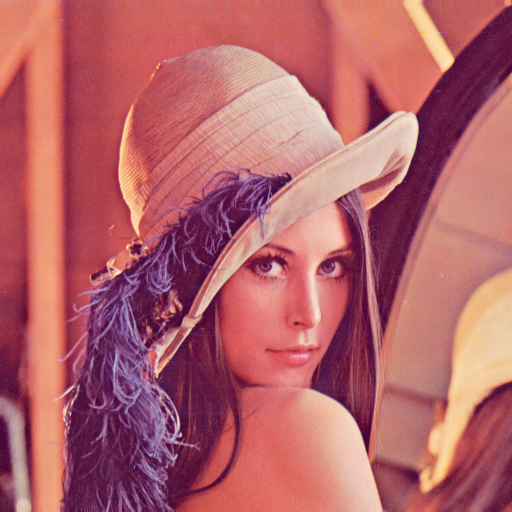

In [5]:
Image(fn)

W0620 09:01:01.198078 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/visualization/anim.py:80: The name tf.read_file is deprecated. Please use tf.io.read_file instead.

W0620 09:01:01.363703 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/visualization/anim.py:86: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

I0620 09:01:01.862817 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:01.866558 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


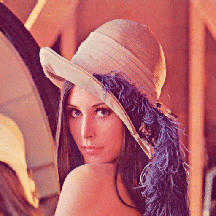

In [6]:
fw.anim.show_transform(fw.transform.random_flip, fn)

W0620 09:01:02.678215 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/vision/transform.py:74: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

I0620 09:01:02.959456 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:02.961317 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


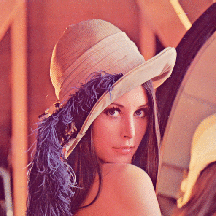

In [7]:
tfm = fw.transform.tfm_random_flip(flip_vert=True)
fw.anim.show_transform(tfm, fn)

W0620 09:01:03.735178 140716090525568 deprecation.py:323] From /content/fenwicks/core.py:42: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
I0620 09:01:03.973617 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:03.975236 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


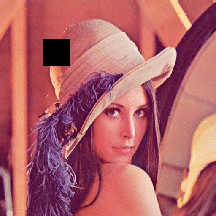

In [8]:
tfm = fw.transform.tfm_cutout(h=64, w=64)
fw.anim.show_transform(tfm, fn)

I0620 09:01:04.947473 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:04.949630 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


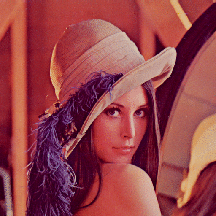

In [9]:
fw.anim.show_transform(fw.transform.distort_color, fn)

W0620 09:01:05.678694 140716090525568 deprecation.py:323] From /content/fenwicks/vision/transform.py:48: sample_distorted_bounding_box (from tensorflow.python.ops.image_ops_impl) is deprecated and will be removed in a future version.
Instructions for updating:
`seed2` arg is deprecated.Use sample_distorted_bounding_box_v2 instead.
I0620 09:01:05.858871 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:05.860848 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


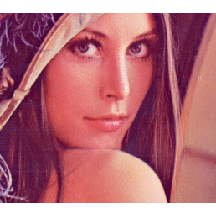

In [10]:
fw.anim.show_transform(fw.transform.distorted_bbox_crop, fn)

W0620 09:01:06.389735 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/vision/transform.py:338: The name tf.image.resize_images is deprecated. Please use tf.image.resize instead.

I0620 09:01:06.737115 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:06.738696 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


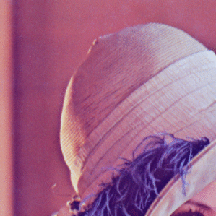

In [11]:
tfms = fw.transform.get_inception_transforms(299, 299, True, normalizer=lambda x:x)
fw.anim.show_transform(tfms, fn)

W0620 09:01:07.374542 140716090525568 deprecation_wrapper.py:119] From /content/fenwicks/vision/transform.py:259: The name tf.random_crop is deprecated. Please use tf.image.random_crop instead.

I0620 09:01:07.626379 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:07.627904 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


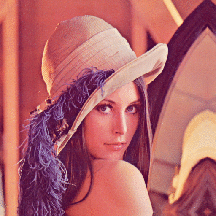

In [12]:
tfm = fw.transform.tfm_pad_crop(32)
fw.anim.show_transform(tfm, fn)

I0620 09:01:09.194802 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:09.196911 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


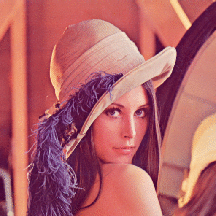

In [13]:
fw.anim.show_transform(fw.transform.random_rotate, fn)

I0620 09:01:10.909554 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:10.916543 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


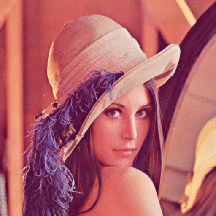

In [14]:
fw.anim.show_transform(fw.transform.random_zoom, fn)

I0620 09:01:12.134801 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:12.136714 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


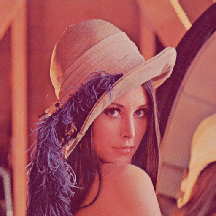

In [15]:
fw.anim.show_transform(fw.transform.random_lighting, fn)

I0620 09:01:13.642906 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:13.644965 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


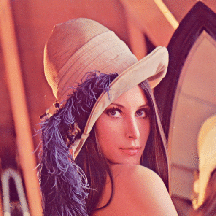

In [16]:
fw.anim.show_transform(fw.transform.random_shear, fn)

I0620 09:01:15.144090 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:15.146159 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


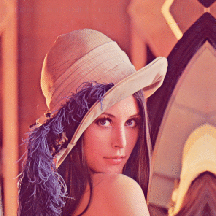

In [17]:
fw.anim.show_transform(fw.transform.random_shift, fn)

I0620 09:01:16.808957 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:16.810831 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


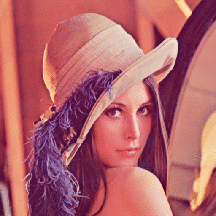

In [18]:
fw.anim.show_transform(fw.transform.random_affine_combo, fn)

I0620 09:01:18.599259 140716090525568 animation.py:1146] Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
I0620 09:01:18.601150 140716090525568 animation.py:350] MovieWriter.run: running command: ['convert', '-size', '216x216', '-depth', '8', '-delay', '20.0', '-loop', '0', 'rgba:-', '/tmp/anim.gif']


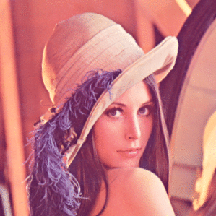

In [19]:
tfms = fw.transform.get_fastai_transforms(299, 299, True, normalizer=lambda x:x)
fw.anim.show_transform(tfms, fn)